# RNAvel

Tutorial followed:

https://smorabit.github.io/blog/2021/velocyto/

https://medium.com/@vishnu.vasan.r.21/rna-velocity-analysis-part-2-unveiling-dynamics-with-scvelo-from-counts-to-insights-275025066405

https://scvelo.readthedocs.io/en/stable/VelocityBasics.html

Github paper

https://github.com/velocyto-team/velocyto-notebooks/blob/master/python/DentateGyrus.ipynb



In [1]:
import os
import scanpy as sc
import scvelo as scv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import anndata as ad
from scipy import io
from pathlib import Path
from scipy.sparse import coo_matrix, csr_matrix
import os
from rpy2 import robjects as ro
import anndata2ri 
import anndata
from anndata import AnnData
from rpy2.robjects import pandas2ri
import cellrank as cr
import matplotlib.image as mpimg
import warnings
warnings.filterwarnings('ignore')
np.random.seed(0)

In [2]:
%%capture
import warnings
warnings.filterwarnings('ignore')


## Step -1: Convert data from Seurat to Python / anndata
I am starting with a mouse BM dataset that contains cells from A12 modified mice and WT mice. I have already performed the primary data processing (filtering, normalization, depletion of non B populations etc.) using Seurat in R




In [3]:
os.listdir('data_NEW')

['metadata_WT.csv',
 'pca_WT.csv',
 'counts_A12.mtx',
 'metadata_A12.csv',
 'sample_alignments_BM_NEW_GMCSU.loom',
 'counts_WT.mtx',
 'pca_A12.csv',
 'gene_names_A12.csv',
 'gene_names_WT.csv']

In [4]:
# load sparse matrix:
X_A12 = io.mmread("TFM/counts_A12.mtx")
X_WT = io.mmread("TFM/counts_WT.mtx")

In [5]:
# create anndata object
adata_A12 = anndata.AnnData(
    X=X_A12.transpose().tocsr()
)
adata_WT = anndata.AnnData(
    X=X_WT.transpose().tocsr()
)

In [6]:
# load cell metadata:
cell_meta_A12 = pd.read_csv("TFM/metadata_A12.csv")
cell_meta_WT = pd.read_csv("TFM/metadata_WT.csv")

In [7]:
# load gene names:
with open("TFM/gene_names_A12.csv", 'r') as f:
    gene_names_A12 = f.read().splitlines()
with open("TFM/gene_names_WT.csv", 'r') as f:
    gene_names_WT = f.read().splitlines()

In [8]:
# set anndata observations and index obs by barcodes, var by gene names
adata_A12.obs = cell_meta_A12
adata_A12.obs.index = adata_A12.obs['barcodes']
adata_A12.var.index = gene_names_A12


In [9]:
adata_A12

AnnData object with n_obs × n_vars = 5295 × 19884
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'percent.mt', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'immgen_BM.main', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'CC.Difference', 'RNA_snn_res.0.9', 'seurat_clusters', 'genotype', 'huIgk', 'mice', 'immgen_BM.fine', 'seurat_clusters_new', 'barcodes', 'UMAP_1', 'UMAP_2'

In [10]:
adata_WT

AnnData object with n_obs × n_vars = 6021 × 19884

In [11]:
adata_WT.obs = cell_meta_WT
adata_WT.obs.index = adata_WT.obs['barcodes']
adata_WT.var.index = gene_names_WT

In [12]:
# load dimensional reduction:
pca_A12 = pd.read_csv("TFM/pca_A12.csv")
pca_A12.index = adata_A12.obs.index

pca_WT = pd.read_csv("TFM/pca_WT.csv")
pca_WT.index = adata_WT.obs.index

In [13]:
# set pca and umap
adata_A12.obsm['X_pca'] = pca_A12.to_numpy()
adata_A12.obsm['X_umap'] = np.vstack((adata_A12.obs['UMAP_1'].to_numpy(), adata_A12.obs['UMAP_2'].to_numpy())).T

adata_WT.obsm['X_pca'] = pca_WT.to_numpy()
adata_WT.obsm['X_umap'] = np.vstack((adata_WT.obs['UMAP_1'].to_numpy(), adata_WT.obs['UMAP_2'].to_numpy())).T

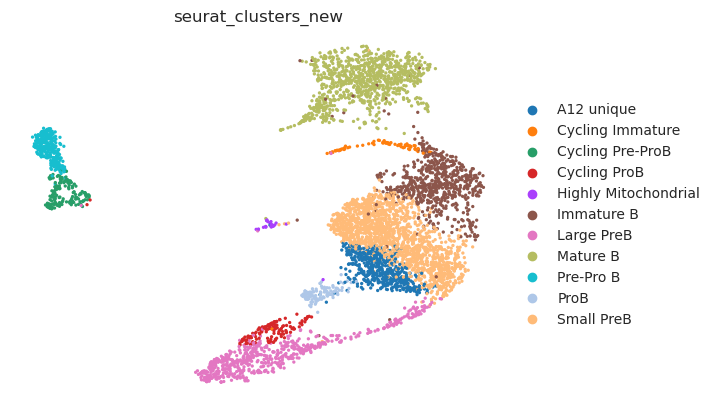

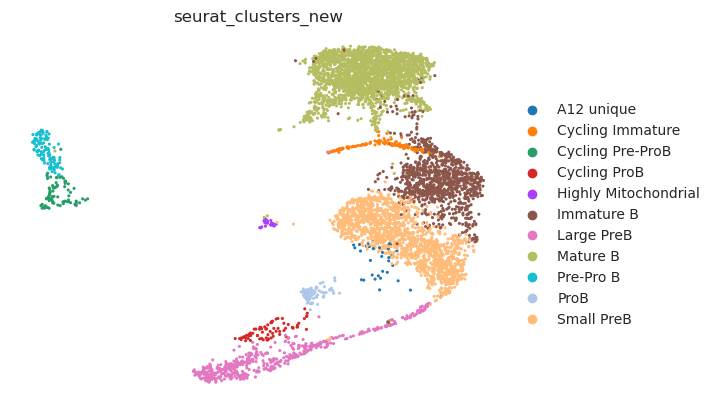

In [14]:
# plot a UMAP colored by sampleID to test:
sc.pl.umap(adata_A12, color=['seurat_clusters_new'], frameon=False, save=True)
sc.pl.umap(adata_WT, color=['seurat_clusters_new'], frameon=False, save=True)

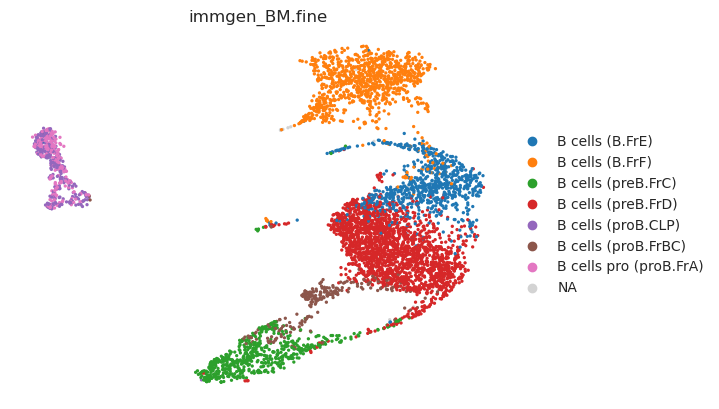

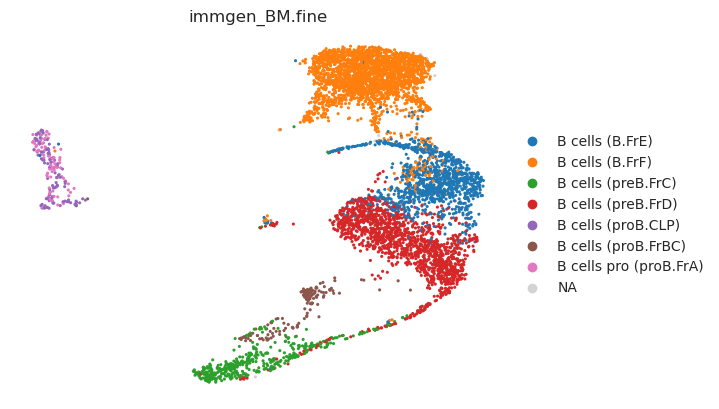

In [15]:
sc.pl.umap(adata_A12, color=['immgen_BM.fine'], frameon=False, save=True)
sc.pl.umap(adata_WT, color=['immgen_BM.fine'], frameon=False, save=True)

In [16]:
adata_A12.write('my_data_A12.h5ad')
adata_WT.write('my_data_WT.h5ad')

In [17]:
adata_A12 = sc.read_h5ad('my_data_A12.h5ad')
adata_WT = sc.read_h5ad('my_data_WT.h5ad')

## Step 0: Constructing spliced and unspliced counts matrices

After running velocyto in cluster, we obtain a .loom file. We have to load this file

In [18]:
scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=100, frameon=False)
cr.settings.verbosity = 2

In [19]:
ldata_BM = scv.read("data/sample_alignments_BM_U3P0G_with_msk.loom", cache= True)

A warning with .var_names_make_unique appears, we will solve this later

In [20]:
# rename barcodes in order to merge:
barcodes = [bc.split(':')[1] for bc in ldata_BM.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_10' for bc in barcodes]
ldata_BM.obs.index = barcodes

In [21]:
# make variable names unique
ldata_BM.var_names_make_unique()

In [22]:
# merge matrices into the original adata object
adata_A12 = scv.utils.merge(adata_A12, ldata_BM)
adata_WT = scv.utils.merge(adata_WT, ldata_BM)

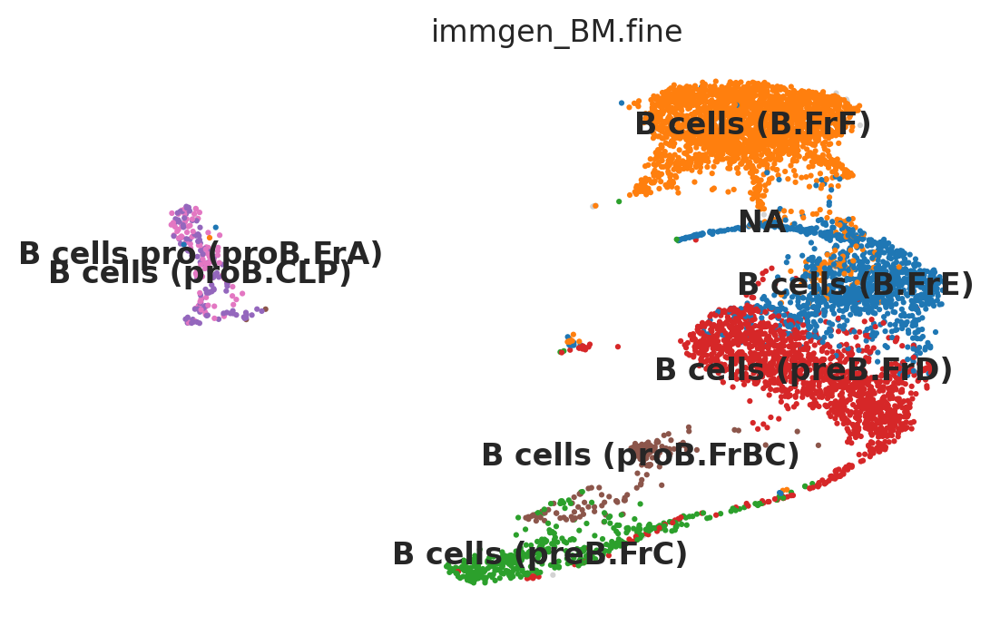

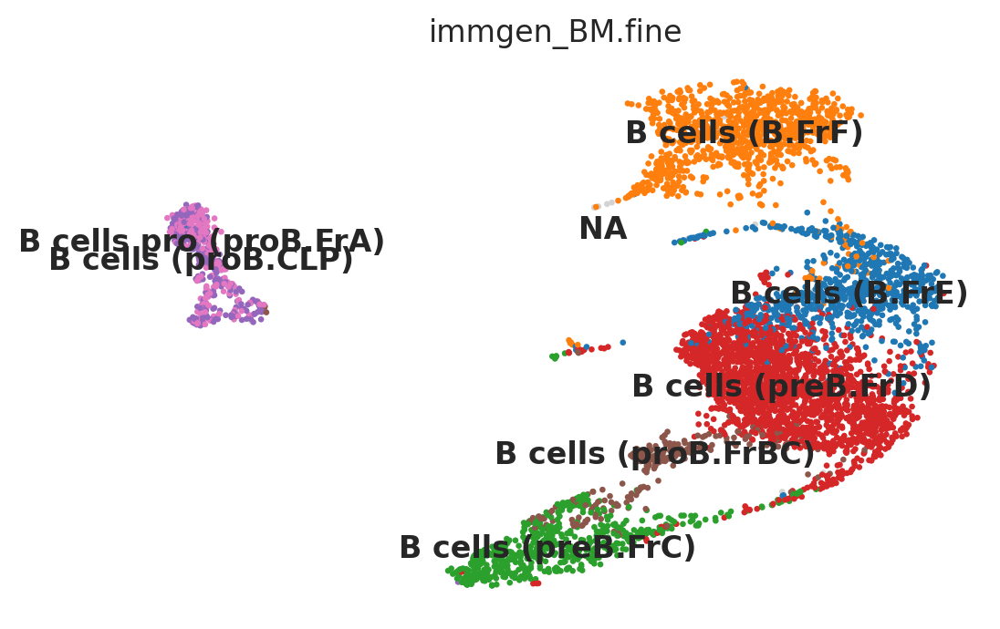

In [23]:
sc.pl.umap(adata_WT, color='immgen_BM.fine', frameon=False, legend_loc='on data', title='immgen_BM.fine', save='_celltypes.pdf')
sc.pl.umap(adata_A12, color='immgen_BM.fine', frameon=False, legend_loc='on data', title='immgen_BM.fine', save='_celltypes.pdf')

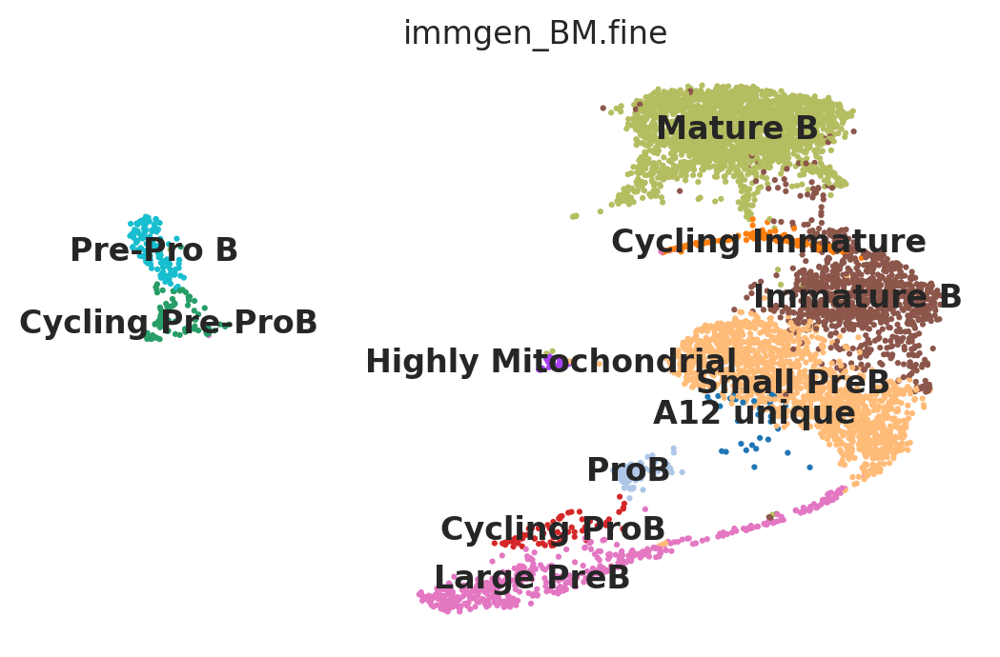

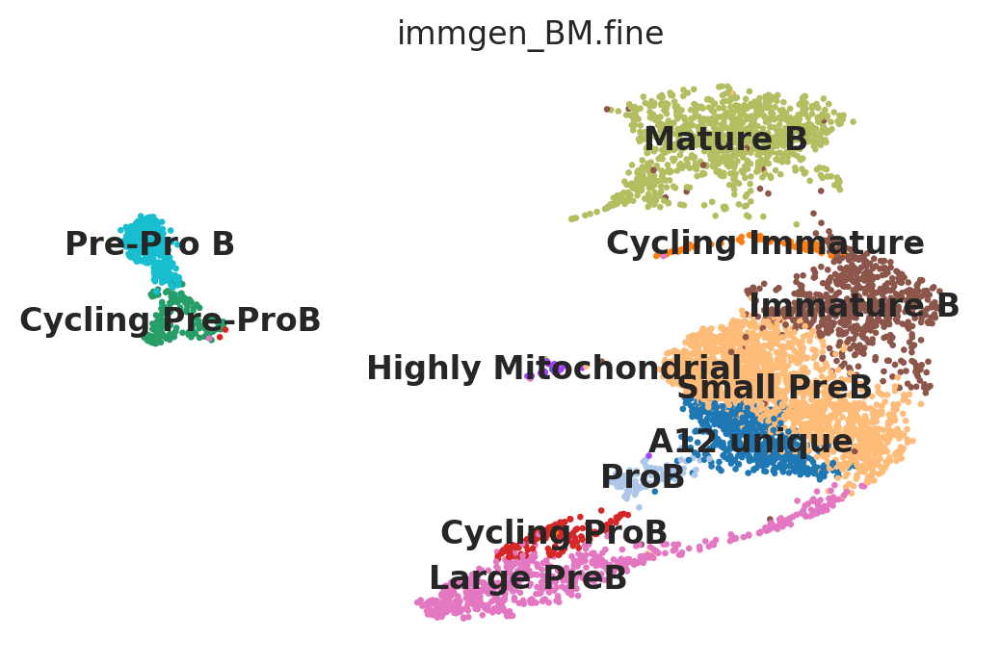

In [24]:
sc.pl.umap(adata_WT, color='seurat_clusters_new', frameon=False, legend_loc='on data', title='immgen_BM.fine', save='_celltypes.pdf')
sc.pl.umap(adata_A12, color='seurat_clusters_new', frameon=False, legend_loc='on data', title='immgen_BM.fine', save='_celltypes.pdf')

## Part 2: Computing RNA velocity using scVelo

Finally we can actually use scVelo to compute RNA velocity. scVelo allows the user to use the updated dynamical model from the 2020 publication.

First we inspect the in each of our cell clusters. Next we perform some pre-processing, and then we compute RNA velocity using the steady-state model (stochastic option).

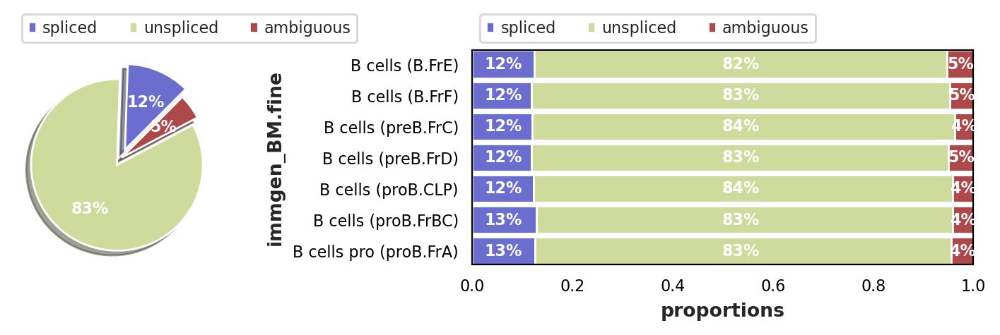

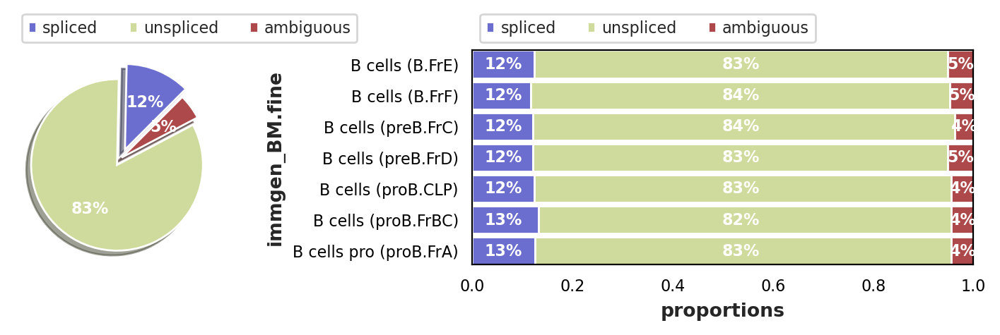

In [25]:
scv.pl.proportions(adata_WT, groupby='immgen_BM.fine')
scv.pl.proportions(adata_A12, groupby='immgen_BM.fine')

In [26]:
adata_WT.X = adata_WT.X.astype(float)
adata_A12.X = adata_A12.X.astype(float)
sc.pp.pca(adata_WT)
sc.pp.pca(adata_A12)

Calculate cumulative explained variance

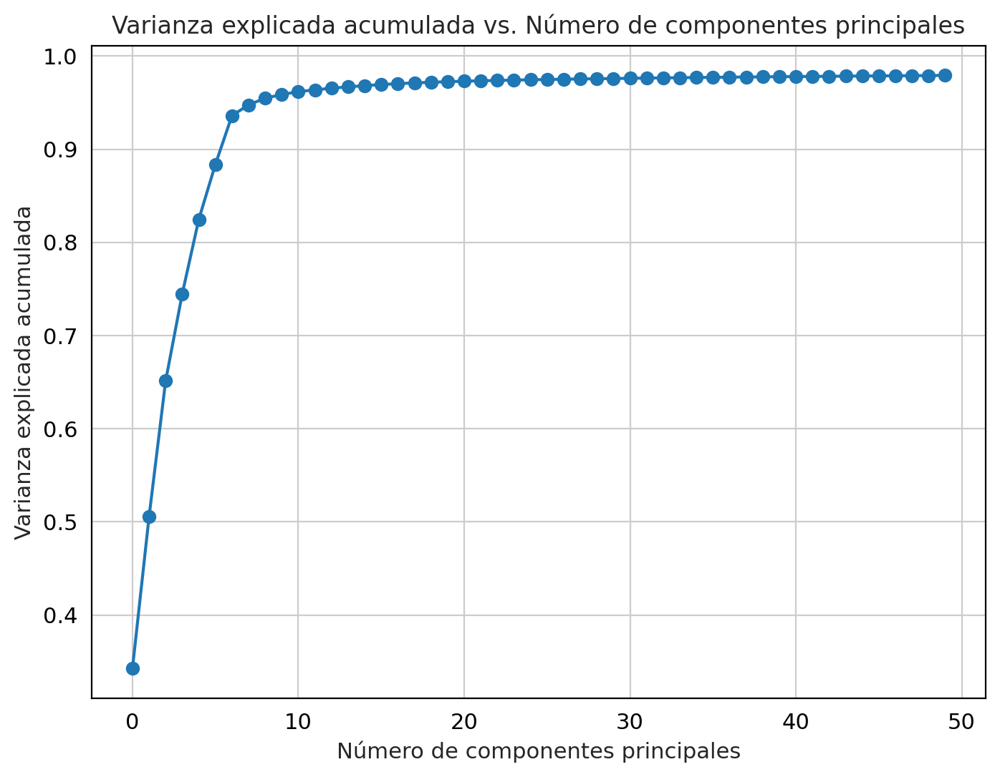

In [27]:
var_exp = adata_WT.uns['pca']['variance_ratio']
cumulative_var_exp = var_exp.cumsum()

plt.figure(figsize=(8, 6))
plt.plot(cumulative_var_exp, marker='o')
plt.xlabel('Número de componentes principales')
plt.ylabel('Varianza explicada acumulada')
plt.title('Varianza explicada acumulada vs. Número de componentes principales')
plt.grid(True)
plt.show()

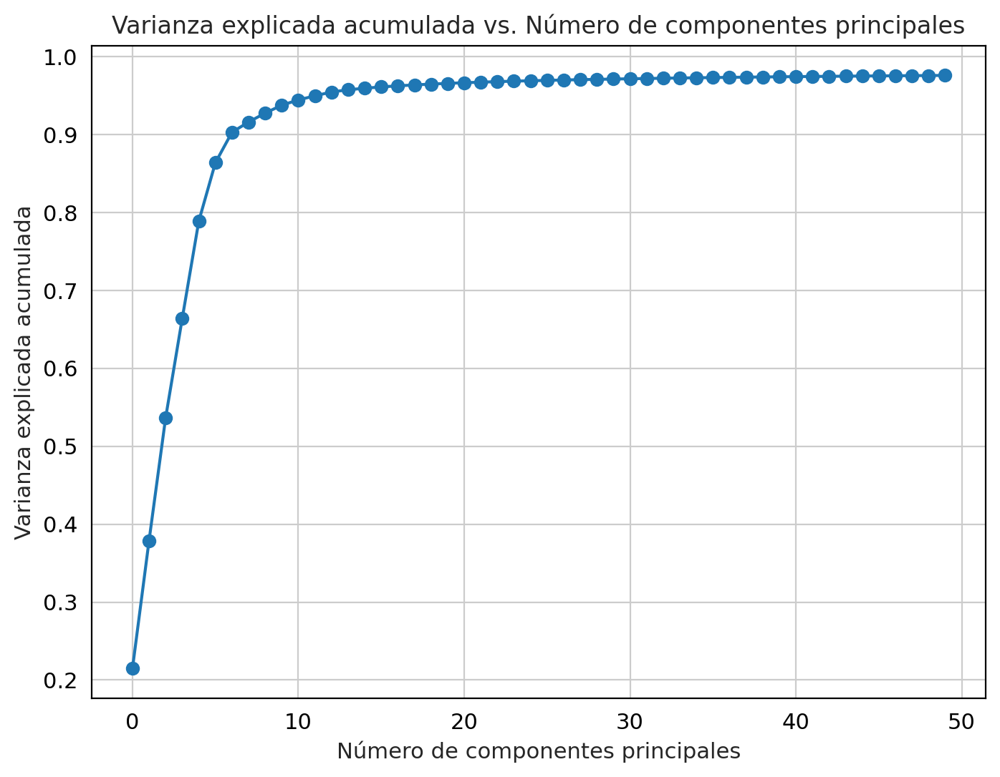

In [28]:
var_exp = adata_A12.uns['pca']['variance_ratio']
cumulative_var_exp = var_exp.cumsum()

plt.figure(figsize=(8, 6))
plt.plot(cumulative_var_exp, marker='o')
plt.xlabel('Número de componentes principales')
plt.ylabel('Varianza explicada acumulada')
plt.title('Varianza explicada acumulada vs. Número de componentes principales')
plt.grid(True)
plt.show()

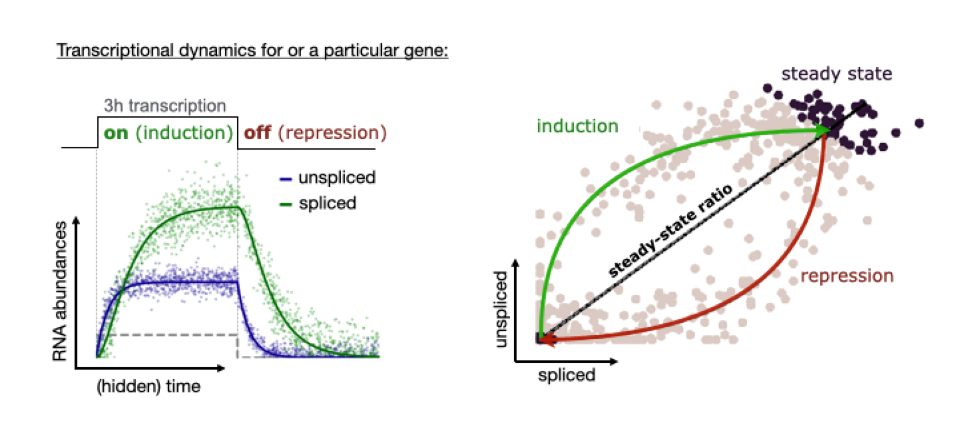

In [29]:

img = mpimg.imread("./data/img.png")

plt.imshow(img)
plt.axis('off')  # Oculta los ejes
plt.show()

Try different parameter settings for number of neighbours and for principal components

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/165 [00:00<?, ?gene/s]

    finished (0:01:21) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/184 [00:00<?, ?gene/s]

    finished (0:01:39) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/198 [00:00<?, ?gene/s]

    finished (0:01:43) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/210 [00:00<?, ?gene/s]

    finished (0:01:49) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:06) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/173 [00:00<?, ?gene/s]

    finished (0:01:22) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/189 [00:00<?, ?gene/s]

    finished (0:01:32) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/197 [00:00<?, ?gene/s]

    finished (0:01:44) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/213 [00:00<?, ?gene/s]

    finished (0:01:57) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/171 [00:00<?, ?gene/s]

    finished (0:01:22) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/184 [00:00<?, ?gene/s]

    finished (0:01:34) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/201 [00:00<?, ?gene/s]

    finished (0:01:39) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:06) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/215 [00:00<?, ?gene/s]

    finished (0:01:59) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

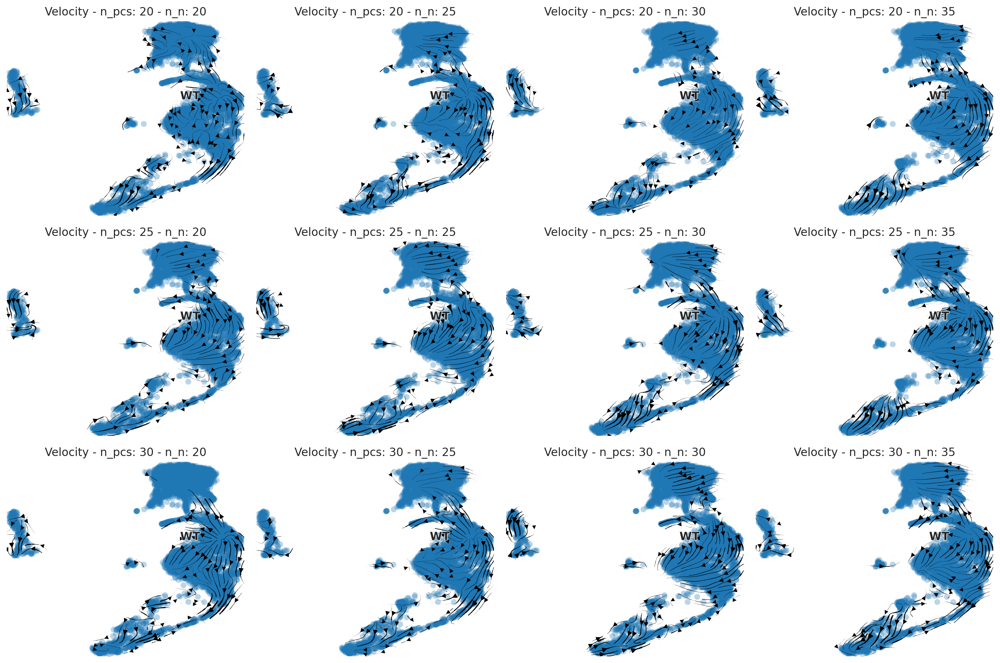

In [30]:
np.random.seed(1)
warnings.filterwarnings('ignore')
def plot_velocity(ds, geno):
    plt.figure(figsize=(15, 10))
    
    for i, n_pcs in enumerate([20, 25, 30]):
        for j, n_n in enumerate([20, 25, 30, 35]):
            ds_copy = ds.copy()
            sc.pp.neighbors(ds_copy, n_pcs=n_pcs, n_neighbors=n_n)
            scv.pp.moments(ds_copy, n_pcs=n_pcs, n_neighbors=n_n)
            
            scv.tl.recover_dynamics(ds_copy)
            scv.tl.velocity(ds_copy, mode = "dynamical")
            scv.tl.velocity_graph(ds_copy)
            
            ax = plt.subplot(3, 4, i*4+j+1)
            scv.pl.velocity_embedding_stream(
                ds_copy, basis='umap', color=['genotype'],
                title='', show=False, ax=ax
            )
            
            ax.set_title(f'Velocity - n_pcs: {n_pcs} - n_n: {n_n}')
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()
                
plot_velocity(adata_WT, "WT")

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/178 [00:00<?, ?gene/s]

    finished (0:01:11) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/196 [00:00<?, ?gene/s]

    finished (0:01:21) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/212 [00:00<?, ?gene/s]

    finished (0:01:27) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/225 [00:00<?, ?gene/s]

    finished (0:01:40) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/182 [00:00<?, ?gene/s]

    finished (0:01:10) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/199 [00:00<?, ?gene/s]

    finished (0:01:16) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/217 [00:00<?, ?gene/s]

    finished (0:01:29) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/237 [00:00<?, ?gene/s]

    finished (0:01:42) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/177 [00:00<?, ?gene/s]

    finished (0:01:06) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/198 [00:00<?, ?gene/s]

    finished (0:01:19) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/215 [00:00<?, ?gene/s]

    finished (0:01:27) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/238 [00:00<?, ?gene/s]

    finished (0:01:43) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:06) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

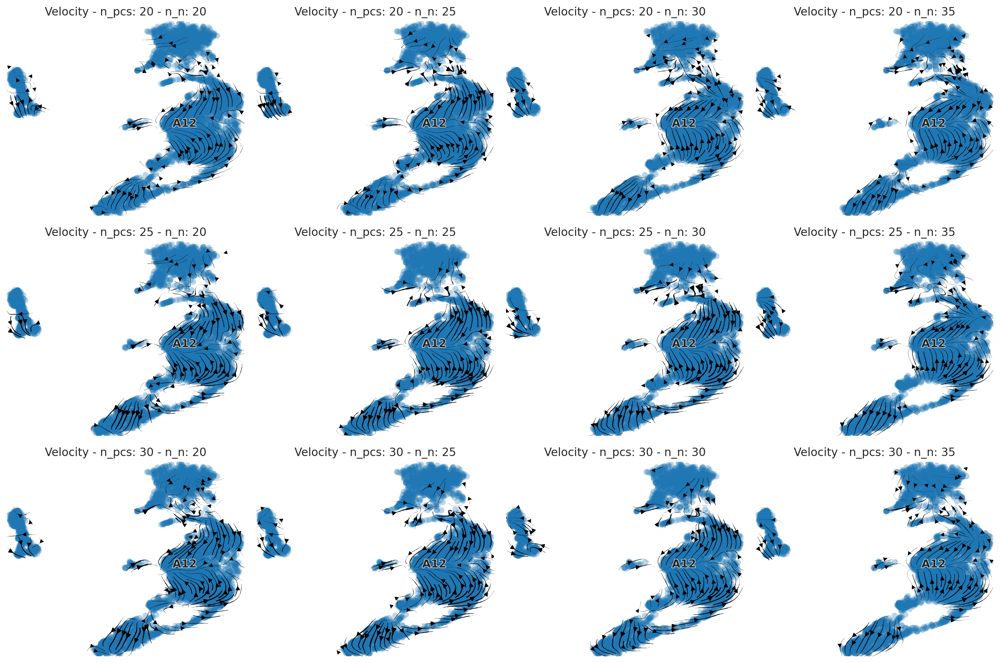

In [31]:
np.random.seed(1)
warnings.filterwarnings('ignore')
plot_velocity(adata_A12, "A12")

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/197 [00:00<?, ?gene/s]

    finished (0:01:58) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/6021 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
recovering dynamics (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/217 [00:00<?, ?gene/s]

    finished (0:01:33) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/5295 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

figure cannot be saved as pdf, using png instead (can only output finite numbers in pdf).
saving figure to file ./figures/scvelo_embedding_stream.png


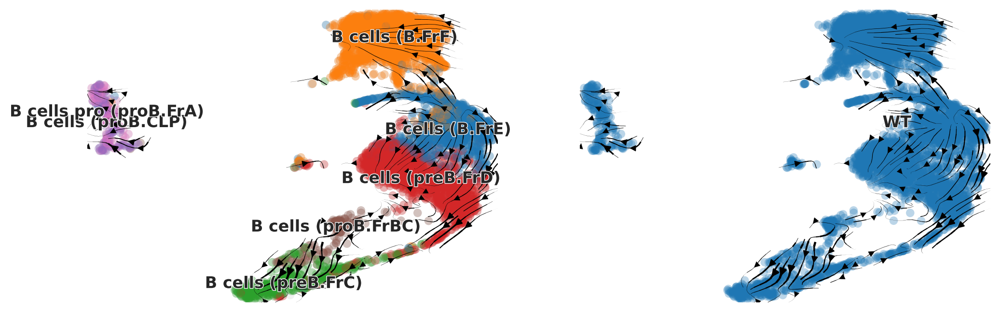

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jmolinav/anaconda3/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: Depre

figure cannot be saved as pdf, using png instead (can only output finite numbers in pdf).
saving figure to file ./figures/scvelo_embedding_stream.png


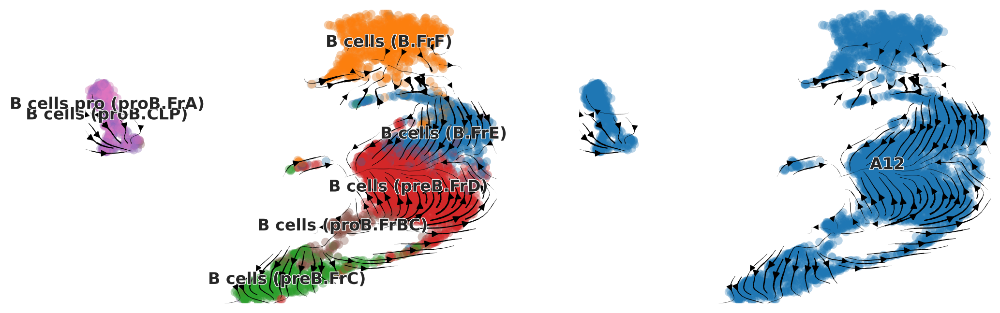

In [30]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata_WT, n_pcs=25, n_neighbors=30)
# scv.pp.filter_and_normalize(adata_WT, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata_WT, n_pcs=25, n_neighbors=30)

sc.pp.neighbors(adata_A12, n_pcs=25, n_neighbors=30)
# scv.pp.filter_and_normalize(adata_A12, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata_A12, n_pcs=25, n_neighbors=30)

scv.tl.recover_dynamics(adata_WT) # This is only if we run dynamical method
scv.tl.velocity(adata_WT, mode='dynamical')
#scv.tl.velocity(adata_WT, mode='stochastic')
#scv.tl.velocity(adata_WT, mode='deterministic')
scv.tl.velocity_graph(adata_WT)


scv.tl.recover_dynamics(adata_A12) # This is only if we run dynamical method
scv.tl.velocity(adata_A12, mode='dynamical')
#scv.tl.velocity(adata_A12, mode='stochastic')
#scv.tl.velocity(adata_A12, mode='deterministic')
scv.tl.velocity_graph(adata_A12)

scv.pl.velocity_embedding_stream(adata_WT, basis='umap', color=["immgen_BM.fine", 'genotype'], save='embedding_stream.pdf', title='')
scv.pl.velocity_embedding_stream(adata_A12, basis='umap', color=["immgen_BM.fine", 'genotype'], save='embedding_stream.pdf', title='')

# Cargar la imagen
img = mpimg.imread("./data/img.png")

# Mostrar la imagen
plt.imshow(img)
plt.axis('off')  # Oculta los ejes
plt.show()
In this image we can see

Dynamics
- Induction Phase (Green Curve): Cells move along this curve as the gene is being turned on. Starts from the lower left (low unspliced and spliced RNA) and moves towards the steady state (higher unspliced and spliced RNA). If unspliced RNA > spliced RNA (we are at the beggining) Then it means that we are producing RNA (induction).
- Repression Phase (Red Curve): Cells move along this curve when the gene is turned off.
Starts from the steady state and moves back towards the lower left (low unspliced and spliced RNA).
- Steady-State Ratio (Black Line): Represents the balance point where the rates of transcription, splicing, and degradation are balanced.
The direction along this line indicates whether the gene is being upregulated (moving towards higher RNA abundance) or downregulated (moving towards lower RNA abundance).

If we had not merged our .loom file with an already preprocessed seurat object, we would have to normalize and preprocess the data. But in this case, our data has already been preprocessed in R in order to generate the seurat file so we can start with velocity estimation.

 We compute the first and second-order moments (means and uncentered variances) among nearest neighbors in PCA space using scv.pp.moments(adata). These calculations are essential for both deterministic and stochastic RNA velocity estimation, providing a nuanced understanding of gene expression dynamics at the single-cell level.
 
**CAUTION**: Number of neighbors and pcs are critical parameters, changing these parameters can alter results. I recomend trying several numbers for number of neighbors. For PCA component number I have plotted above the accumulative sum of explained variance.

**Moments function Explanation**
Neighbor Graph Construction: scv.pp.moments first constructs a k-nearest neighbor (k-NN) graph in the PCA space. This graph represents the relationships between cells based on their gene expression profiles in the reduced PCA space, where each cell is connected to its nearest neighbors.

First-order Moments (Means): The function calculates the mean expression levels of genes across the nearest neighbors for each cell. These means provide a local average gene expression profile, capturing the general trend of gene expression in the neighborhood of each cell.

Second-order Moments (Uncentered Variances): It also computes the uncentered variances of gene expression among the nearest neighbors. The uncentered variance is the average of the squared expression values without subtracting the mean. This measure captures the variability of gene expression around each cell, indicating how much the expression levels deviate within the neighborhood.

**RNA Velocity Estimation (scv.tl.velocity(adata))**
The scv.tl.velocity(adata) function estimates RNA velocities based on the moments calculated in the previous step. Here's a detailed breakdown of what happens during RNA velocity estimation and the differences from moments calculation:

Modeling Splicing Kinetics: RNA velocity estimation involves modeling the transcriptional dynamics of splicing kinetics. This can be done using either deterministic or stochastic models:

Deterministic Models: Assume a fixed rate of transcription, splicing, and degradation. They fit linear models to the gene expression data, estimating velocities based on steady-state ratios of unspliced (pre-mature) to spliced (mature) mRNA.
Stochastic Models: Incorporate randomness in transcriptional dynamics, providing a more probabilistic view of gene expression changes.

Fitting Steady-State Ratios: For each gene, the steady-state ratio of unspliced to spliced mRNA counts is fitted. This ratio helps in determining whether a gene is being up-regulated or down-regulated:
Up-Regulation: An increase in unspliced mRNA relative to spliced mRNA indicates up-regulation.
Down-Regulation: A decrease in unspliced mRNA relative to spliced mRNA indicates down-regulation.

Calculating Velocities: The RNA velocities are calculated as vectors representing the direction and speed of gene expression changes for each cell. These vectors point in the direction of increasing or decreasing gene expression levels and provide insights into the cellular state transitions.


For a more comprehensive analysis of RNA velocities and gene expression dynamics, you can utilize the 'dynamical' mode in scVelo. This mode employs a more detailed and sophisticated model that captures the full splicing kinetics and transcriptional dynamics, leading to a deeper understanding of gene regulation at the single-cell level. Here's how you can achieve this:

Setting Up Dynamical Mode
Recover Dynamics: Before estimating RNA velocities in dynamical mode, you need to recover the dynamics of the splicing kinetics for each gene. This step is performed using scv.tl.recover_dynamics(adata). This function fits a dynamical model of splicing kinetics to the data, capturing the detailed gene expression dynamics over time.

Estimate RNA Velocities: After recovering the dynamics, you can estimate the RNA velocities using scv.tl.velocity(adata, mode='dynamical'). This step utilizes the detailed model fitted in the previous step to estimate more accurate RNA velocities.

Differences from Deterministic/Stochastic Mode:
Deterministic Mode: Assumes constant rates and fits a simple linear model to the data.
Stochastic Mode: Incorporates randomness and provides a probabilistic view of gene expression changes.
Dynamical Mode: Uses a more comprehensive model that captures the entire splicing kinetics and transcriptional dynamics, providing the most detailed and accurate estimation of RNA velocities.
Why Use Dynamical Mode?
Detailed Dynamics: Captures the full complexity of gene expression dynamics, including the transient states and the steady-state behavior of genes.
Accurate Velocities: Provides more accurate RNA velocity estimates, leading to better insights into cellular state transitions and gene regulation.
Regulatory Mechanisms: Helps in exploring the intricate regulatory mechanisms underlying single-cell gene expression patterns, giving a deeper understanding of biological processes.



Velocities are vectors in gene expression space and represent the direction and speed of movement of the individual cells. The velocities are obtained by modeling transcriptional dynamics of splicing kinetics, either stochastically (default) or deterministically (by setting mode='deterministic'). For each gene, a steady-state-ratio of pre-mature (unspliced) and mature (spliced) mRNA counts is fitted, which constitutes a constant transcriptional state. Velocities are then obtained as residuals from this ratio. Positive velocity indicates that a gene is up-regulated, which occurs for cells that show higher abundance of unspliced mRNA for that gene than expected in steady state. Conversely, negative velocity indicates that a gene is down-regulated. During a dynamic process, an increase in the transcription rate
α results in a rapid increase in unspliced mRNA, followed by a subsequent increase in spliced mRNA

The combination of velocities across genes can then be used to estimate the future state of an individual cell. In order to project the velocities into a lower-dimensional embedding, transition probabilities of cell-to-cell transitions are estimated. That is, for each velocity vector we find the likely cell transitions that are accordance with that direction. The transition probabilities are computed using cosine correlation between the potential cell-to-cell transitions and the velocity vector, and are stored in a matrix denoted as velocity graph. The resulting velocity graph has dimension nobs×nobs
 and summarizes the possible cell state changes that are well explained through the velocity vectors (for runtime speedup it can also be computed on reduced PCA space by setting approx=True).

saving figure to file ./figures/scvelo_embedding_WT.pdf


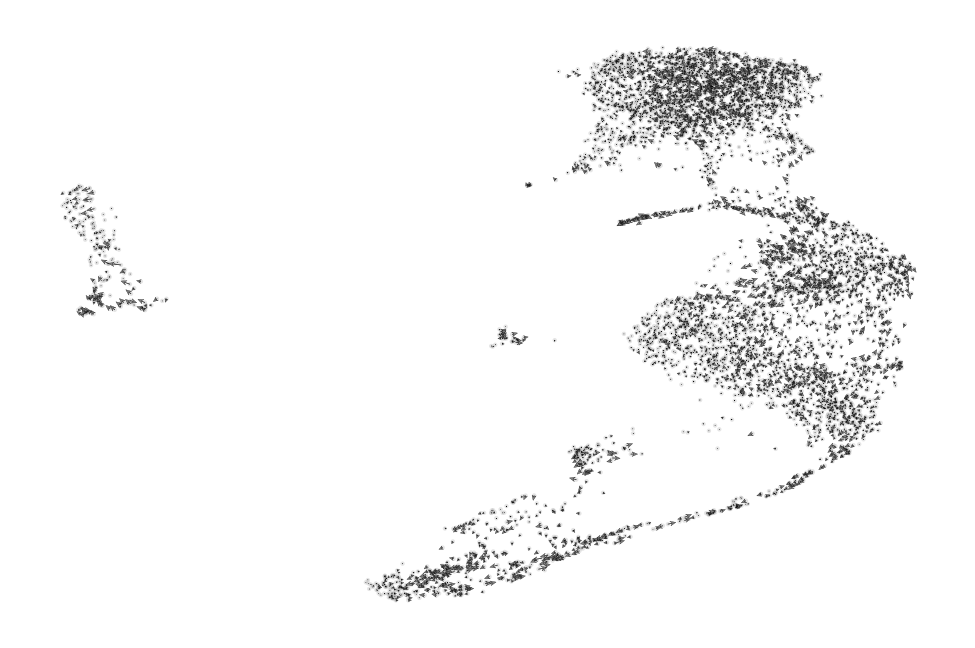

saving figure to file ./figures/scvelo_embedding_A12.pdf


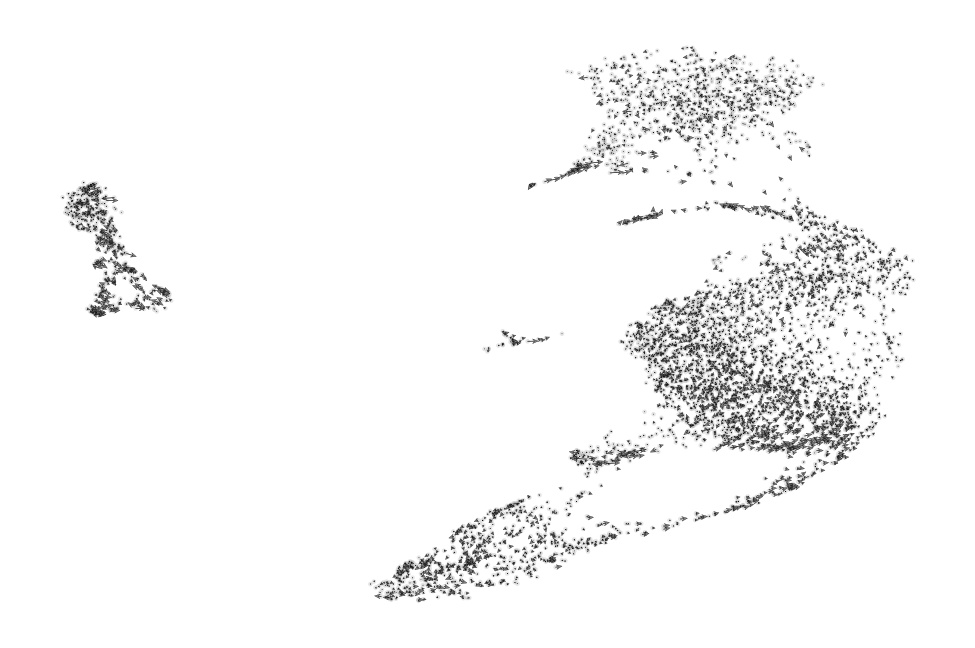

In [32]:
scv.pl.velocity_embedding(adata_WT, basis='umap', frameon=False, save='embedding_WT.pdf')
scv.pl.velocity_embedding(adata_A12, basis='umap', frameon=False, save='embedding_A12.pdf')

saving figure to file ./figures/scvelo_embedding_grid_WT.pdf


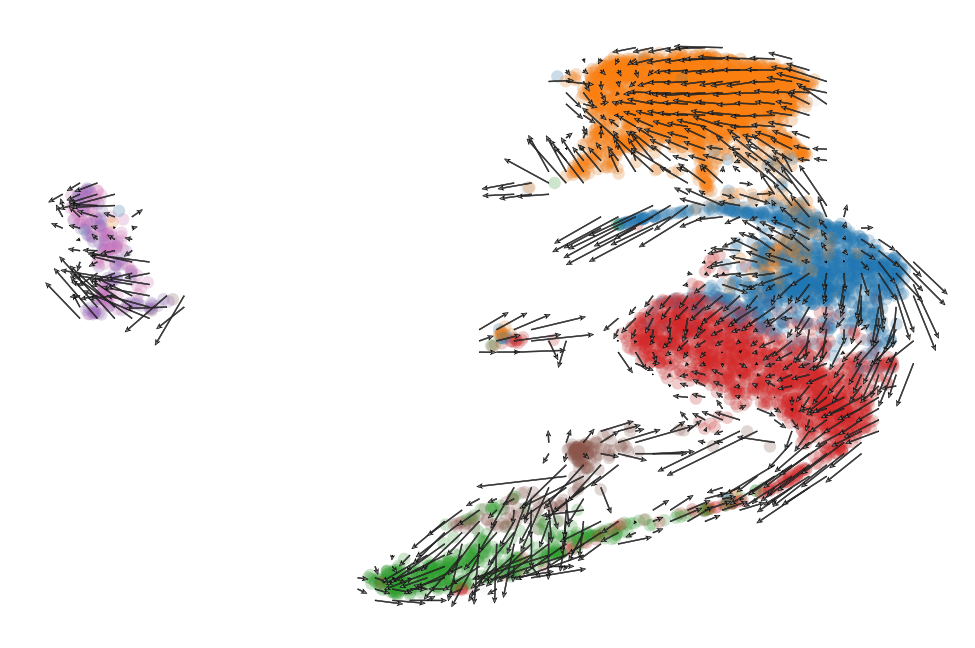

saving figure to file ./figures/scvelo_embedding_grid_A12.pdf


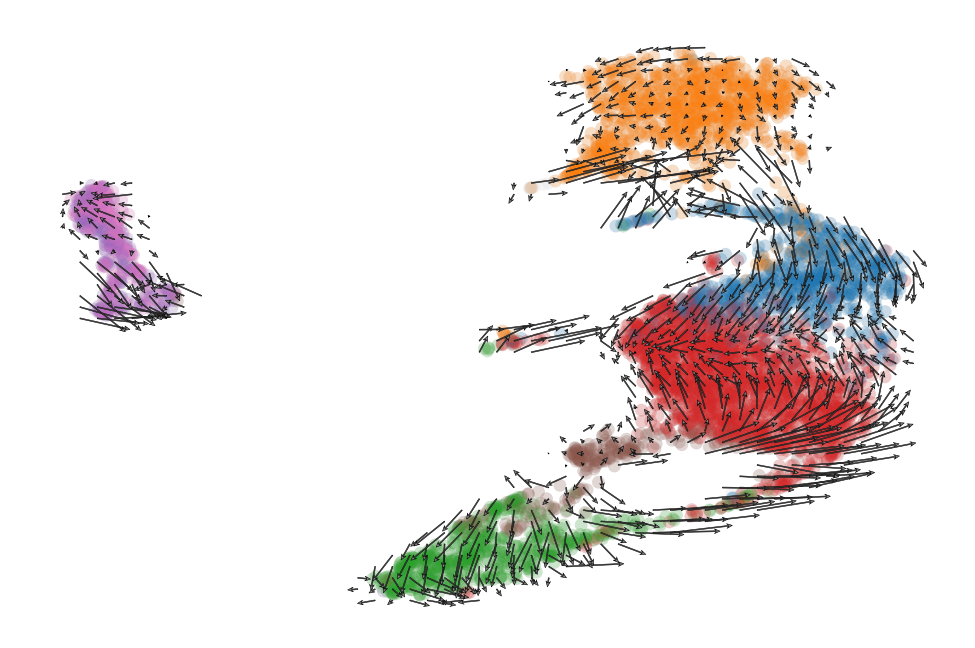

In [33]:
warnings.filterwarnings('ignore')
scv.pl.velocity_embedding_grid(adata_WT, basis='umap', color="immgen_BM.fine", save='embedding_grid_WT.pdf', title='', scale=0.25)
scv.pl.velocity_embedding_grid(adata_A12, basis='umap', color="immgen_BM.fine", save='embedding_grid_A12.pdf', title='', scale=0.25)

saving figure to file ./figures/scvelo_embedding_grid.pdf


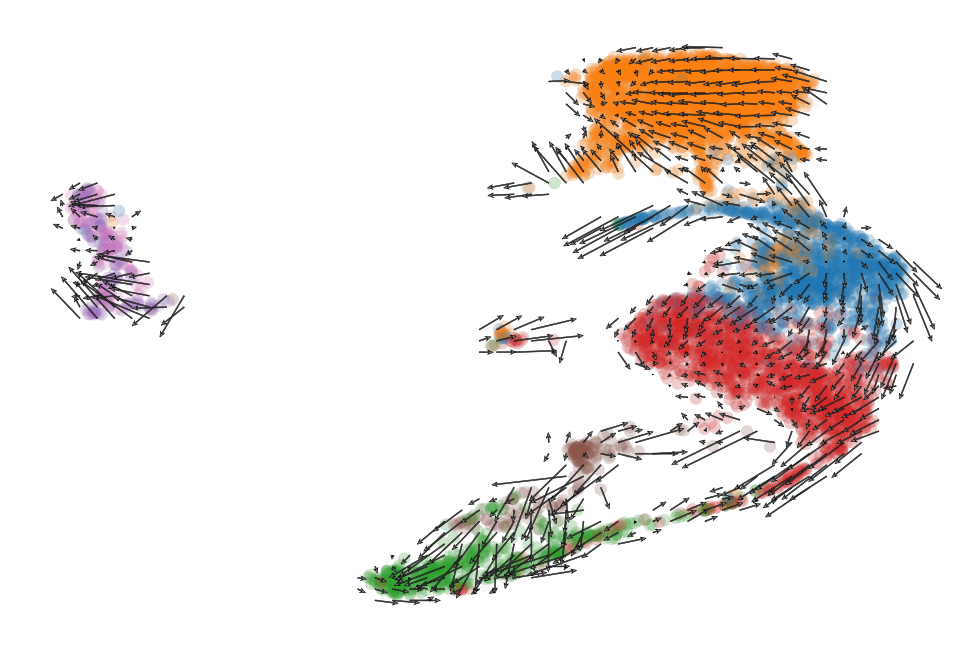

saving figure to file ./figures/scvelo_embedding_grid.pdf


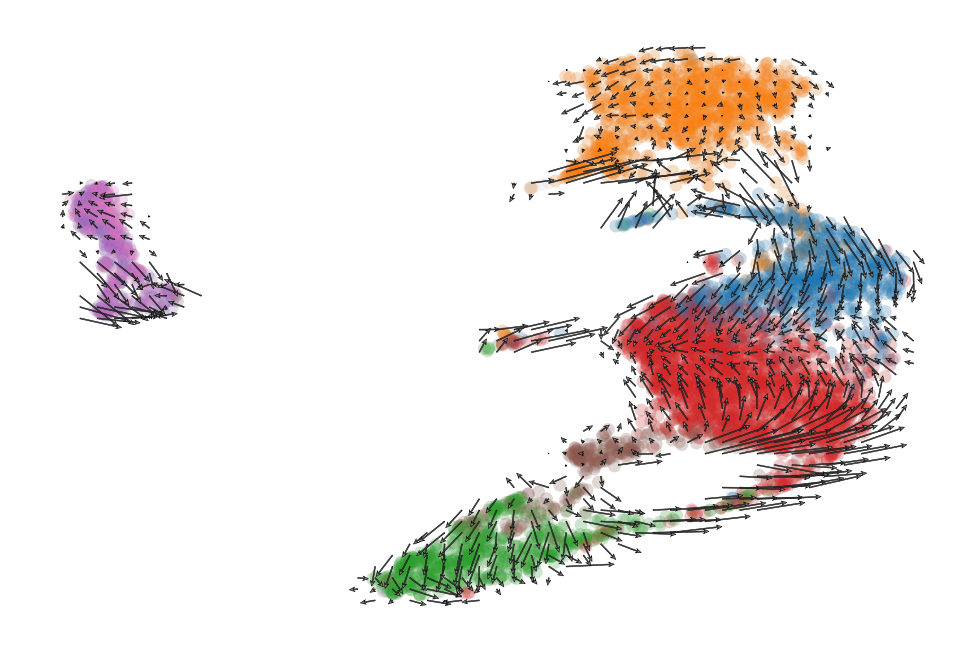

In [34]:
warnings.filterwarnings('ignore')
scv.pl.velocity_embedding_grid(adata_WT, basis='umap', color="immgen_BM.fine", save='embedding_grid.pdf', title='', scale=0.30)
scv.pl.velocity_embedding_grid(adata_A12, basis='umap', color="immgen_BM.fine", save='embedding_grid.pdf', title='', scale=0.30)

figure cannot be saved as pdf, using png instead (can only output finite numbers in pdf).
saving figure to file ./figures/scvelo_embedding_stream.png


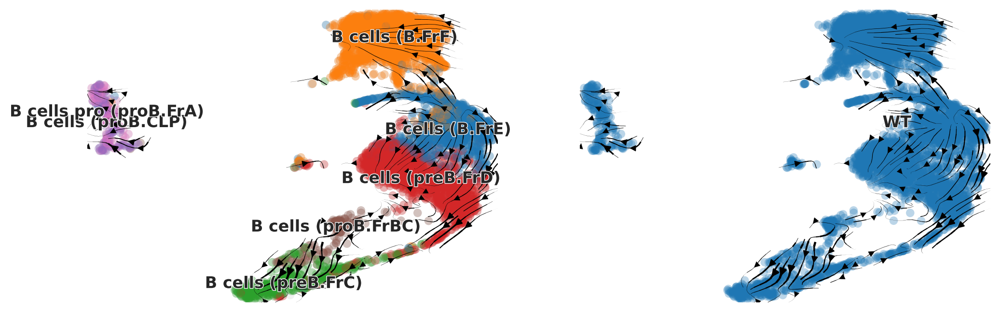

figure cannot be saved as pdf, using png instead (can only output finite numbers in pdf).
saving figure to file ./figures/scvelo_embedding_stream.png


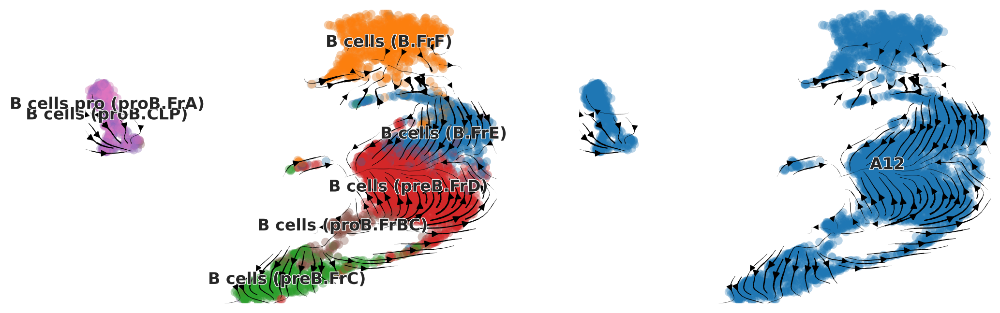

In [35]:
warnings.filterwarnings('ignore')
scv.pl.velocity_embedding_stream(adata_WT, basis='umap', color=["immgen_BM.fine", 'genotype'], save='embedding_stream.pdf', title='')
scv.pl.velocity_embedding_stream(adata_A12, basis='umap', color=["immgen_BM.fine", 'genotype'], save='embedding_stream.pdf', title='')

- Speed: length of the velocity vector
- Coherence: how well a velocity vector correlates to its neighbors

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)


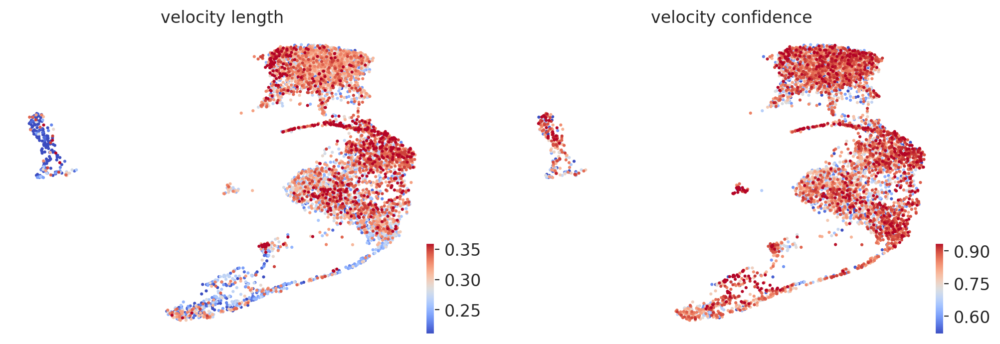

In [76]:
warnings.filterwarnings('ignore')
scv.tl.velocity_confidence(adata_WT)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_WT, c=keys, cmap='coolwarm', perc=[5, 95])

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)


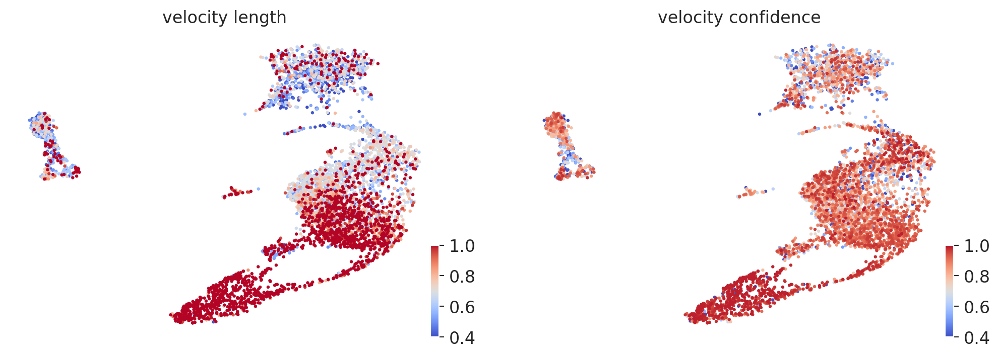

In [77]:
warnings.filterwarnings('ignore')
scv.tl.velocity_confidence(adata_A12)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_A12, c=keys, cmap='coolwarm', perc=[5, 95], vmin = 0.4, vmax = 1)